## Import and Definitions

In [29]:
# import of libraries
import random
import imageio
import numpy as np
from argparse import ArgumentParser

from tqdm.auto import tqdm
import matplotlib.pyplot as plt

import einops
import torch
import torch.nn as nn
from torch.optim import Adam
from torch.utils.data import DataLoader

from torchvision.transforms import Compose,ToTensor,Lambda
from torchvision.datasets.mnist import MNIST,FashionMNIST

# setting reproducbility
SEED = 0
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)


# Definitions
STORE_PATH_MNIST = f'ddpm_model_mnist.pt'
STORE_PATH_FASHION = f'ddpm_model_fashion.pt'


## Execution options
设置训练的超参数数据，具体可以设置的参数如下

+ `no_train`表明是否使用预训练模型而跳过训练轮
+ `fashion`表明使用的数据集市`MNIST`还是`Fashion-MNIST`
+ `batch_size`,`n_epochs`和`lr`是训练所需的超参数

In [30]:
no_train = False
fashion = False # MNIST dataset
batch_size = 128
n_epochs = 20
lr = 0.01

store_path = 'ddpm_fashion.pt' if fashion else 'ddpm_mnist.pt'

## Utility functions
为了更好地可视化结果,此处定义了两个函数:`show_images`以`sub_plots`的方式展示多张图像，`show_first_batch`展示DataLOader里第一个batch中的数据。

In [31]:
def show_images(images, title=""):
    """Shows the provided images as sub-pictures in a square"""

    # Converting images to CPU numpy arrays
    if type(images) is torch.Tensor:
        images = images.detach().cpu().numpy()

    # Defining number of rows and columns
    fig = plt.figure(figsize=(8, 8))
    rows = int(len(images) ** (1 / 2))
    cols = round(len(images) / rows)

    # Populating figure with sub-plots
    idx = 0
    for r in range(rows):
        for c in range(cols):
            fig.add_subplot(rows, cols, idx + 1)

            if idx < len(images):
                plt.imshow(images[idx][0], cmap="gray")
                idx += 1
    fig.suptitle(title, fontsize=30)

    # Showing the figure
    plt.show()

In [32]:
def show_first_batch(loader):
    for batch in loader:
        show_images(batch[0], "Images in the first batch")
        break

### Loading data
此处使用`MNIST`以及`FashionMNIST`数据集，测试时目标是让模型可以从随机高斯噪声中产生新的样本。<b>NOTE</b>:此处将图片的范围定为`[-1,1]`而非`[0,1]`。原因是`DDPM`训练过程中加入的随机噪声服从标准正态分布。

In [33]:
# Loading the data
transform =  Compose([
    ToTensor(),
    Lambda(lambda x:(x - 0.5) * 2)
])

ds_fn = FashionMNIST if fashion else MNIST
dataset = ds_fn("./datasets", download=True, train=True, transform=transform)
loader = DataLoader(dataset, batch_size, shuffle=True)

100%|██████████| 9912422/9912422 [00:05<00:00, 1737963.46it/s]


Extracting ./datasets/MNIST/raw/train-images-idx3-ubyte.gz to ./datasets/MNIST/raw



100%|██████████| 28881/28881 [00:00<00:00, 3371529.79it/s]


Extracting ./datasets/MNIST/raw/train-labels-idx1-ubyte.gz to ./datasets/MNIST/raw



100%|██████████| 1648877/1648877 [00:00<00:00, 2938442.32it/s]


Extracting ./datasets/MNIST/raw/t10k-images-idx3-ubyte.gz to ./datasets/MNIST/raw



100%|██████████| 4542/4542 [00:00<00:00, 10393087.16it/s]

Extracting ./datasets/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./datasets/MNIST/raw



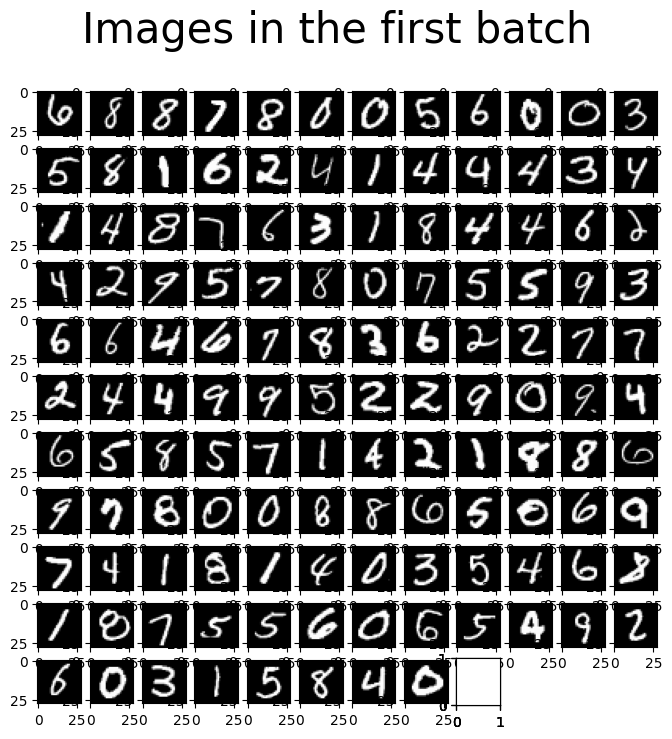

In [34]:
# Show a btach of regular images
show_first_batch(loader)

### Getting device


In [35]:
# Getting device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}\t" + (f"{torch.cuda.get_device_name(0)}" if torch.cuda.is_available() else "CPU") )

Using device: cuda	NVIDIA TITAN Xp


## Defining the DDPM module

现在可以开始定义DDPM模型，我们使用如下参数:
+ `n_steps`:扩散步数$T$.
+ `min_beta`:$\beta_t$中的最小值(此处为$\beta_1$).
+ `max_beta`:$\beta_t$中的最大值(此处为$\beta_t$).
+ `device`:gpu
+ `image_chw`:存储输入图像的维度

### `forward` process
在前向过程中，我们可以利用原论文的推导，利用参数$\alpha_b a r$只进行一次扩散便得到最终的结果。

### `backward` process
在反向过程中，我们则让模型逐步的实现去噪的功能。

In [36]:
# DDPM class
class MyDDPM(nn.Module):
    def __init__(self, network, n_steps=200, min_beta=10** -4, max_beta=0.02, device=None,
                 images_chw=(1,28,28)):
        super(MyDDPM, self).__init__()
        self.n_steps = n_steps
        self.device = device
        self.image_chw = images_chw
        self.network = network.to(device)
        # 线性增加beta
        self.betas = torch.linspace(min_beta, max_beta, n_steps).to(device) 
        self.alphas = 1 - self.betas
        self.alpha_bars=torch.tensor([torch.prod(self.alphas[:i+1]) for i in range(len(self.alphas))]).to(device)
    
    def forward(self, x0, t, eta=None):
        # Make input image more noisy
        n, c, h, w = x0.shape
        a_bar=self.alpha_bars[t]
        
        if eta is None:
            eta = torch.randn(n, c, h, w).to(self.device)
        
        noisy = a_bar.sqrt().reshape(n, 1, 1, 1) * x0 + (1 - a_bar).sqrt().reshape(n, 1, 1 ,1) * eta
        return noisy
    
    def backward(self, x, t):
        # Run each image through the network for each timestep t in the vector t.
        # The network returns its estimation of the noise that was added.
        return self.network(x, t)

### Visualizing forward and backward

在还没有定义网络模型的情况下，我们已经定义了`DDPM`模型。由此，我们可以定义可视化前向以及反向过程中可视化函数如下。

In [37]:
def show_forward(ddpm, loader, device):
    # Showing the forward porcess
    for batch in loader:
        imgs = batch[0]
        
        show_images(imgs,"Orignial images")
        
        for percent in [0.25, 0.5, 0.75, 1]:
            show_images(
                ddpm(imgs.to(device),
                     [int(percent * ddpm.n_steps) - 1 for _ in range(len(imgs))]),
                f"DDPM Noisy images {int(percent * 100)}%"
            )
            
        break

In [38]:
def generate_new_images(ddpm, n_samples=16, device=None, frames_per_gif=100,gif_name="sampling.gif", c=1, h=28, w=28):
    """Given a DDPM model, a number of samples to be generated and a device, returns some newly generated samples"""
    frame_idxs = np.linspace(0, ddpm.n_steps, frames_per_gif).astype(np.uint)
    frames = []

    with torch.no_grad():
        if device is None:
            device = ddpm.device

        # Starting from random noise
        x = torch.randn(n_samples, c, h, w).to(device)

        for idx, t in enumerate(list(range(ddpm.n_steps))[::-1]):
            # Estimating noise to be removed
            time_tensor = (torch.ones(n_samples, 1) * t).to(device).long()
            eta_theta = ddpm.backward(x, time_tensor)

            alpha_t = ddpm.alphas[t]
            alpha_t_bar = ddpm.alpha_bars[t]

            # Partially denoising the image
            x = (1 / alpha_t.sqrt()) * (x - (1 - alpha_t) / (1 - alpha_t_bar).sqrt() * eta_theta)

            if t > 0:
                z = torch.randn(n_samples, c, h, w).to(device)

                # Option 1: sigma_t squared = beta_t
                beta_t = ddpm.betas[t]
                sigma_t = beta_t.sqrt()

                # Option 2: sigma_t squared = beta_tilda_t
                # prev_alpha_t_bar = ddpm.alpha_bars[t-1] if t > 0 else ddpm.alphas[0]
                # beta_tilda_t = ((1 - prev_alpha_t_bar)/(1 - alpha_t_bar)) * beta_t
                # sigma_t = beta_tilda_t.sqrt()

                # Adding some more noise like in Langevin Dynamics fashion
                x = x + sigma_t * z

            # Adding frames to the GIF
            if idx in frame_idxs or t == 0:
                # Putting digits in range [0, 255]
                normalized = x.clone()
                for i in range(len(normalized)):
                    normalized[i] -= torch.min(normalized[i])
                    normalized[i] *= 255 / torch.max(normalized[i])

                # Reshaping batch (n, c, h, w) to be a (as much as it gets) square frame
                frame = einops.rearrange(normalized, "(b1 b2) c h w -> (b1 h) (b2 w) c", b1=int(n_samples ** 0.5))
                frame = frame.cpu().numpy().astype(np.uint8)

                # Rendering frame
                frames.append(frame)

    # Storing the gif
    with imageio.get_writer(gif_name, mode="I") as writer:
        for idx, frame in enumerate(frames):
            writer.append_data(frame)
            if idx == len(frames) - 1:
                for _ in range(frames_per_gif // 3):
                    writer.append_data(frames[-1])
    return x

### UNet architecture
我们此处定义用于去噪的模型，根据原论文，我们选用`UNet`模型。模型的优化目标为 $||\epsilon-\epsilon_\theta(\sqrt{\bar{\alpha}_t}x_0+\sqrt{1-\bar{\alpha}_t}\epsilon,t)||^2$ ,此处的 $\epsilon$ 是随机产生的参数,$\epsilon_\theta$ 是模型预估的噪声大小。值得注意的是，在所有的时间步中，去噪模型共享同一套参数。因此，为了区分不同的时间步，此处利用`sinusoidal embedding`的方式，将时间步作为参数输入到模型之中。

In [39]:
def sinusoidal_embedding(n,d):
    # Return the standard positional embedding
    embedding = torch.zeros(n,d)
    wk = torch.tensor([1 / 10_000 ** (2 * j /d) for j in range(d)])
    wk = wk.reshape((1,d))
    t = torch.arange(n).reshape((n,1))
    embedding[:,::2] = torch.sin(t * wk[:,::2])
    embedding[:,1::2] = torch.cos(t * wk[:,::2])
    
    return embedding

In [40]:
class MyBlock(nn.Module):
    def __init__(self, shape, in_c, out_c, kernel_size=3, stride=1, 
                 padding=1, activation=None,normalize=True):
        super(MyBlock,self).__init__()
        self.ln = nn.LayerNorm(shape)
        self.conv1 = nn.Conv2d(in_c, out_c, kernel_size, stride, padding)
        self.conv2 = nn.Conv2d(out_c, out_c, kernel_size, stride, padding)
        self.activation = nn.SiLU() if activation is None else activation
        self.normalize = normalize
    
    def forward(self, x):
        out = self.ln(x) if self.normalize else x
        out = self.conv1(out)
        out = self.activation(out)
        out = self.conv2(out)
        out = self.activation(out)
        
        return out

In [41]:
class MyUNet(nn.Module):
    def __init__(self, n_steps=10000, time_emb_dim=100):
        super(MyUNet, self).__init__()
        
        # Sinusoidal embedding
        self.time_embed = nn.Embedding(n_steps, time_emb_dim)
        self.time_embed.weight.data = sinusoidal_embedding(n_steps, time_emb_dim)
        self.time_embed.requires_grad_(False)
        
        # First half
        self.te1 = self._make_te(time_emb_dim,1)
        self.b1 = nn.Sequential(
            MyBlock((1, 28, 28), 1, 10),
            MyBlock((10, 28, 28), 10, 10),
            MyBlock((10, 28, 28), 10, 10)
        )
        
        self.down1 = nn.Conv2d(10, 10, 4, 2, 1)
        
        self.te2 = self._make_te(time_emb_dim, 10)
        self.b2 = nn.Sequential(
            MyBlock((10, 14, 14), 10, 20),
            MyBlock((20, 14, 14), 20, 20),
            MyBlock((20, 14, 14), 20, 20)
        )
        self.down2 = nn.Conv2d(20, 20, 4, 2, 1)

        self.te3 = self._make_te(time_emb_dim, 20)
        self.b3 = nn.Sequential(
            MyBlock((20, 7, 7), 20, 40),
            MyBlock((40, 7, 7), 40, 40),
            MyBlock((40, 7, 7), 40, 40)
        )
        self.down3 = nn.Sequential(
            nn.Conv2d(40, 40, 2, 1),
            nn.SiLU(),
            nn.Conv2d(40, 40, 4, 2, 1)
        )

        # Bottleneck
        self.te_mid = self._make_te(time_emb_dim, 40)
        self.b_mid = nn.Sequential(
            MyBlock((40, 3, 3), 40, 20),
            MyBlock((20, 3, 3), 20, 20),
            MyBlock((20, 3, 3), 20, 40)
        )
        
        # Second half
        self.up1 = nn.Sequential(
            nn.ConvTranspose2d(40, 40, 4, 2, 1),
            nn.SiLU(),
            nn.ConvTranspose2d(40, 40, 2, 1)
        )

        self.te4 = self._make_te(time_emb_dim, 80)
        self.b4 = nn.Sequential(
            MyBlock((80, 7, 7), 80, 40),
            MyBlock((40, 7, 7), 40, 20),
            MyBlock((20, 7, 7), 20, 20)
        )

        self.up2 = nn.ConvTranspose2d(20, 20, 4, 2, 1)
        self.te5 = self._make_te(time_emb_dim, 40)
        self.b5 = nn.Sequential(
            MyBlock((40, 14, 14), 40, 20),
            MyBlock((20, 14, 14), 20, 10),
            MyBlock((10, 14, 14), 10, 10)
        )

        self.up3 = nn.ConvTranspose2d(10, 10, 4, 2, 1)
        self.te_out = self._make_te(time_emb_dim, 20)
        self.b_out = nn.Sequential(
            MyBlock((20, 28, 28), 20, 10),
            MyBlock((10, 28, 28), 10, 10),
            MyBlock((10, 28, 28), 10, 10, normalize=False)
        )
        
        self.conv_out = nn.Conv2d(10, 1, 3, 1, 1)
    
    def forward(self, x, t):
        # x is (N, 2, 28, 28) (image with positional embedding stacked on channel dimension)
        t = self.time_embed(t)
        n = len(x)
        out1 = self.b1(x + self.te1(t).reshape(n, -1, 1, 1))  # (N, 10, 28, 28)
        out2 = self.b2(self.down1(out1) + self.te2(t).reshape(n, -1, 1, 1))  # (N, 20, 14, 14)
        out3 = self.b3(self.down2(out2) + self.te3(t).reshape(n, -1, 1, 1))  # (N, 40, 7, 7)

        out_mid = self.b_mid(self.down3(out3) + self.te_mid(t).reshape(n, -1, 1, 1))  # (N, 40, 3, 3)

        out4 = torch.cat((out3, self.up1(out_mid)), dim=1)  # (N, 80, 7, 7)
        out4 = self.b4(out4 + self.te4(t).reshape(n, -1, 1, 1))  # (N, 20, 7, 7)

        out5 = torch.cat((out2, self.up2(out4)), dim=1)  # (N, 40, 14, 14)
        out5 = self.b5(out5 + self.te5(t).reshape(n, -1, 1, 1))  # (N, 10, 14, 14)

        out = torch.cat((out1, self.up3(out5)), dim=1)  # (N, 20, 28, 28)
        out = self.b_out(out + self.te_out(t).reshape(n, -1, 1, 1))  # (N, 1, 28, 28)

        out = self.conv_out(out)

        return out

    def _make_te(self, dim_in, dim_out):
        return nn.Sequential(
            nn.Linear(dim_in, dim_out),
            nn.SiLU(),
            nn.Linear(dim_out, dim_out)
        )

## Instantiating the model


In [42]:
# Defining model
n_steps, min_beta, max_beta = 1000, 10 ** -4, 0.02  # Originally used by the authors
ddpm = MyDDPM(MyUNet(n_steps), n_steps=n_steps, min_beta=min_beta, max_beta=max_beta, device=device)

In [43]:
sum([p.numel() for p in ddpm.parameters()])

606852

## Noisy Porocess Visualization

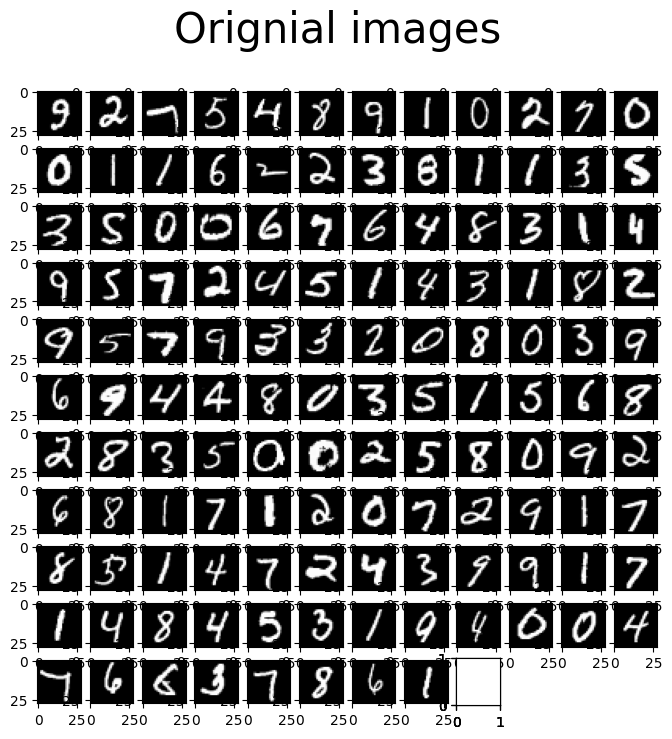

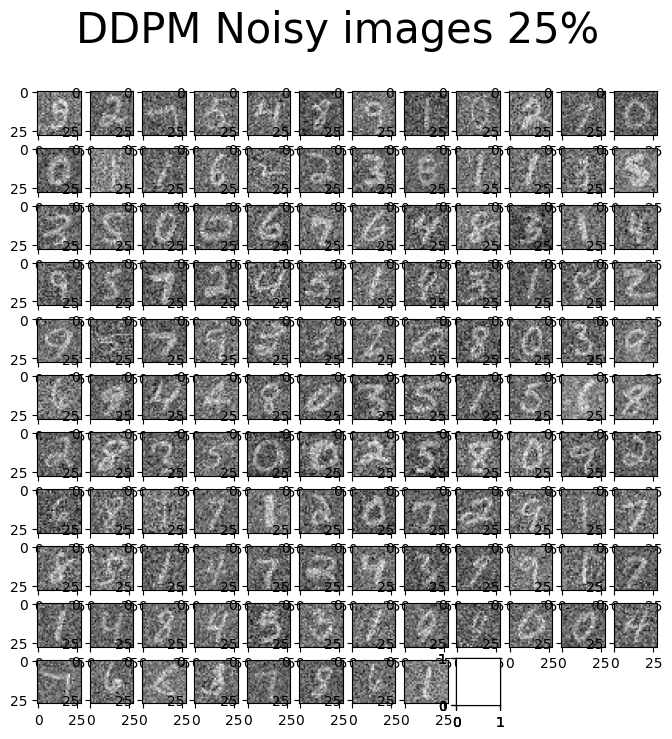

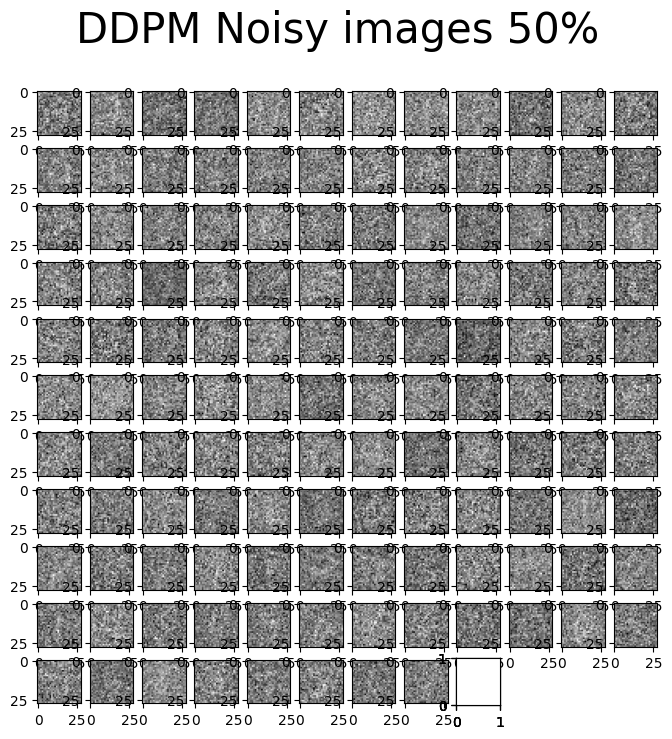

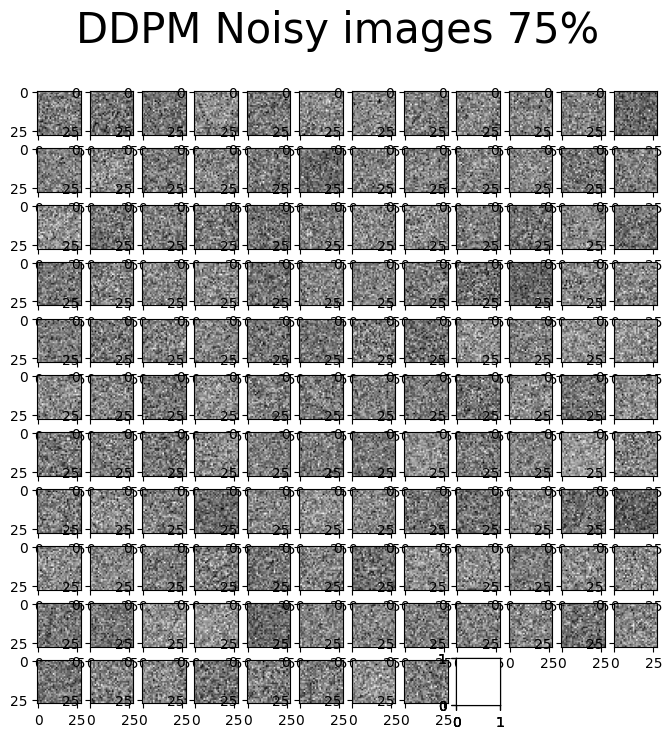

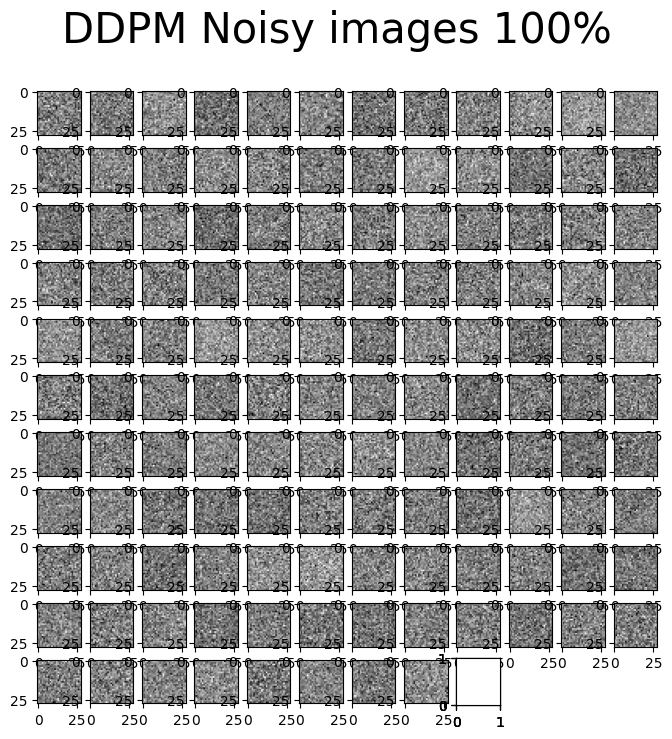

In [44]:
# Optionally, show the diffusion (forward) process
show_forward(ddpm, loader, device)

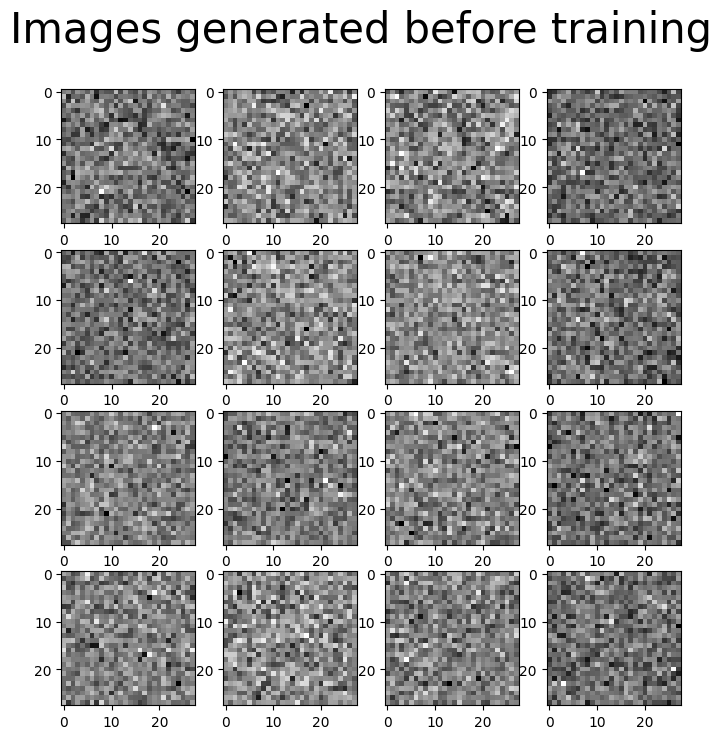

In [45]:
# Optionally, show the denoising (backward) process
generated = generate_new_images(ddpm, gif_name="before_training.gif")
show_images(generated, "Images generated before training")

## Training Loop

In [46]:
def training_loop(ddpm, loader, n_epochs, optim, device, display=False,
                 store_path="ddpm_model.pt"):
    mse = nn.MSELoss()
    best_loss = float("inf")
    n_steps = ddpm.n_steps
    
    for epoch in tqdm(range(n_epochs), desc=f"Training progress", colour="#00f00"):
        epoch_loss = 0.0
        for step, batch in enumerate(tqdm(loader, leave=False, desc=f"Epoch {epoch + 1}/{n_epochs}", colour="#005500")):
            # loading data
            x0 = batch[0].to(device)
            n = len(x0)
            
            # Picking some noise for each of the images in the batch,  atimestep and the respective aplha_bars
            eta = torch.randn_like(x0).to(device)
            t = torch.randint(0, n_steps, (n,)).to(device)
            
            # Computing the noisy image based on x0 and the time-step (forward process)
            noisy_imgs = ddpm(x0, t, eta)
            
            # Getting model estimation of noise based on the image and the time-step
            eta_theta = ddpm.backward(noisy_imgs, t.reshape(n,-1))
            
            # Optimizing the MSE between the noise plugged and the predicted noise
            loss =mse(eta_theta, eta)
            optim.zero_grad()
            loss.backward()
            optim.step()
            
            epoch_loss +=loss.item() * len(x0) / len(loader.dataset)
        
        # Display images generated at this epoch
        if display:
            show_images(generate_new_images(ddpm, device=device), f"Images generated at epoch {epoch + 1}")

        log_string = f"Loss at epoch {epoch + 1}: {epoch_loss:.3f}"

        # Storing the model
        if best_loss > epoch_loss:
            best_loss = epoch_loss
            torch.save(ddpm.state_dict(), store_path)
            log_string += " --> Best model ever (stored)"

        print(log_string)
            

In [47]:
# Training
store_path = "ddpm_fashion.pt" if fashion else "ddpm_mnist.pt"
if not no_train:
    training_loop(ddpm, loader, n_epochs, optim=Adam(ddpm.parameters(), lr), device=device, store_path=store_path)

/data3/cjh/anaconda3/envs/pytorch_cjh_39/lib/python3.9/site-packages/tqdm/std.py:163: TqdmWarning: Unknown colour (#00f00); valid choices: [hex (#00ff00), BLACK, RED, GREEN, YELLOW, BLUE, MAGENTA, CYAN, WHITE]
  self.colour = colour
Training progress:   5%|▌         | 1/20 [00:25<08:04, 25.48s/it]

Loss at epoch 1: 0.114 --> Best model ever (stored)


Training progress:  10%|█         | 2/20 [00:50<07:35, 25.33s/it]

Loss at epoch 2: 0.048 --> Best model ever (stored)


Training progress:  15%|█▌        | 3/20 [01:15<07:09, 25.28s/it]

Loss at epoch 3: 0.041 --> Best model ever (stored)


Training progress:  20%|██        | 4/20 [01:43<06:58, 26.13s/it]

Loss at epoch 4: 0.039 --> Best model ever (stored)


Training progress:  25%|██▌       | 5/20 [02:08<06:27, 25.85s/it]

Loss at epoch 5: 0.038 --> Best model ever (stored)


Training progress:  30%|███       | 6/20 [02:32<05:53, 25.22s/it]

Loss at epoch 6: 0.037 --> Best model ever (stored)


Training progress:  35%|███▌      | 7/20 [02:56<05:20, 24.63s/it]

Loss at epoch 7: 0.036 --> Best model ever (stored)


Training progress:  40%|████      | 8/20 [03:19<04:50, 24.22s/it]

Loss at epoch 8: 0.037


Training progress:  45%|████▌     | 9/20 [03:42<04:23, 23.92s/it]

Loss at epoch 9: 0.036 --> Best model ever (stored)


Training progress:  50%|█████     | 10/20 [04:06<03:57, 23.73s/it]

Loss at epoch 10: 0.035 --> Best model ever (stored)


Training progress:  55%|█████▌    | 11/20 [04:29<03:32, 23.57s/it]

Loss at epoch 11: 0.035 --> Best model ever (stored)


Training progress:  60%|██████    | 12/20 [04:52<03:08, 23.57s/it]

Loss at epoch 12: 0.034 --> Best model ever (stored)


Training progress:  65%|██████▌   | 13/20 [05:16<02:44, 23.56s/it]

Loss at epoch 13: 0.034 --> Best model ever (stored)


Training progress:  70%|███████   | 14/20 [05:40<02:22, 23.82s/it]

Loss at epoch 14: 0.034


Training progress:  75%|███████▌  | 15/20 [06:04<01:58, 23.69s/it]

Loss at epoch 15: 0.034


Training progress:  80%|████████  | 16/20 [06:27<01:34, 23.58s/it]

Loss at epoch 16: 0.033 --> Best model ever (stored)


Training progress:  85%|████████▌ | 17/20 [06:51<01:10, 23.57s/it]

Loss at epoch 17: 0.034


Training progress:  90%|█████████ | 18/20 [07:14<00:46, 23.48s/it]

Loss at epoch 18: 0.034


Training progress:  95%|█████████▌| 19/20 [07:37<00:23, 23.39s/it]

Loss at epoch 19: 0.033 --> Best model ever (stored)


Training progress: 100%|██████████| 20/20 [08:01<00:00, 24.05s/it]

Loss at epoch 20: 0.033 --> Best model ever (stored)


## Testing the trained model

In [48]:
# Loading the trained model
best_model = MyDDPM(MyUNet(n_steps), n_steps=n_steps, device=device)
best_model.load_state_dict(torch.load(store_path, map_location=device))
best_model.eval()
print("Model loaded")

Model loaded


Generating new images


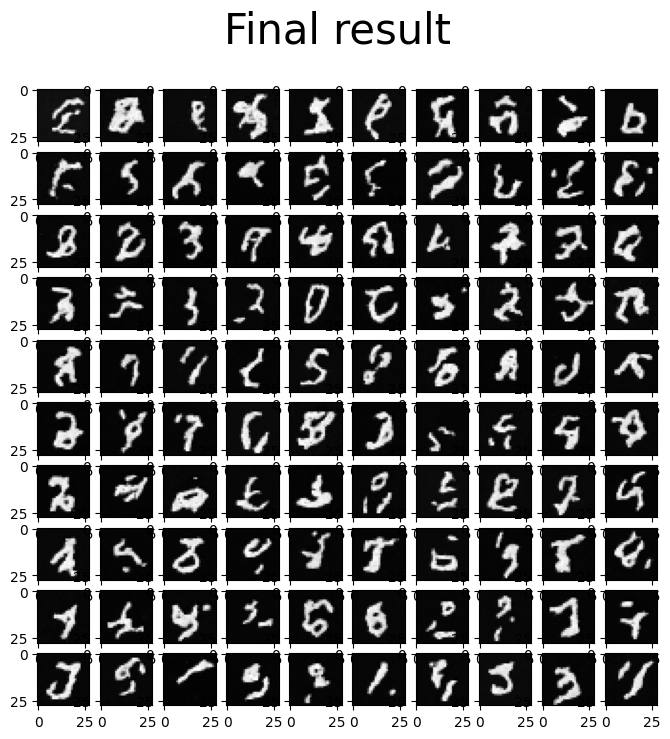

In [49]:
print("Generating new images")
generated = generate_new_images(
        best_model,
        n_samples=100,
        device=device,
        gif_name="fashion.gif" if fashion else "mnist.gif"
    )
show_images(generated, "Final result")

### Visualizing the diffusion


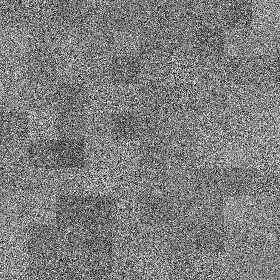

In [50]:
from IPython.display import Image

Image(open('fashion.gif' if fashion else 'mnist.gif','rb').read())